In [4]:
import pandas as pd
import numpy as np
from itertools import product

df = pd.read_csv('../raw_data/output_clean.csv', sep=',')
df2=df.transpose()
df2.columns = df2.iloc[0]
df2.drop(df2.index[0], inplace=True)
df=df2
df.index=df.index.str.replace('_t:','')
df.index=df.index.str.replace('/:','')
columns_to_convert = ['b1', 'b2', 'b3','b4','b5']  # Specify the columns you want to convert
for column in columns_to_convert:
    df[column] = df[column].astype(float)
df

FileNotFoundError: [Errno 2] No such file or directory: '../raw_data/output_clean.csv'

In [206]:
def get_hazard(in_df, out_df):
    for model in range(1, 6):
        model_name = f'b{model}'
        gamma = float(in_df.at['gamma', model_name])
        cons = float(in_df.at['_cons', model_name])
        
        ac_values = [(index[:2], value) for index, value in in_df.loc[in_df.index.str.endswith('.AC'), model_name].items()]
        coh_values = [(index[:4], value) for index, value in in_df.loc[in_df.index.str.endswith('.coh'), model_name].items()]
        dis_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.dis_d'), model_name].items()]
        sex_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.SEX'), model_name].items()] if model_name in ['b2', 'b3', 'b4', 'b5'] else [('No', 1)]
        imm_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.imm_d'), model_name].items()] if model_name in ['b3', 'b4', 'b5'] else [('No', 1)]
        mrt_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.mrt'), model_name].items()] if model_name in ['b3', 'b4', 'b5'] else [('No', 1)]
        pen_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.p_lvl'), model_name].items()] if model_name in ['b4', 'b5'] else [('No', 1)]
        ppen_values = [(index[:1], value) for index, value in in_df.loc[in_df.index.str.endswith('.pp_lvl'), model_name].items()] if model_name == 'b5' else [('No', 1)]
        
        t = np.arange(40)
        # Generate all possible combinations of values
        combinations = product(ac_values, coh_values, dis_values, sex_values, imm_values, mrt_values, pen_values, ppen_values)
        for ac, coh, dis, sex, imm, mrt, pen, ppen in combinations:
            fct = cons * ac[1] * coh[1] * dis[1] * sex[1] * imm[1] * mrt[1] * pen[1] * ppen[1] * np.exp(t * gamma)
            new_row = {'AC': ac[0], 'coh': coh[0], 'dis': dis[0], 'sex': sex[0], 'imm': imm[0], 'mrt': mrt[0], 'p': pen[0], 'pp': ppen[0], 't': t, 'ht': fct}
            out_df = out_df.append(new_row, ignore_index=True)
    return out_df

hazard = pd.DataFrame(columns=['AC', 'coh', 'dis', 'sex', 'imm', 'mrt', 'p', 'pp', 't', 'ht'])
hazard = get_hazard(df, hazard)


C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\2286418474.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

In [94]:
#hazard['id']=(
#'AC:'+hazard['AC'].astype(str)+
#',coh:'+hazard['coh'].astype(str)+
#',dis:'+hazard['dis'].astype(str)+
#',sex:'+hazard['sex'].astype(str)+
#',imm:'+hazard['imm'].astype(str)+
#',p:'+hazard['p'].astype(str)+
#',pp:'+hazard['pp']).astype(str)
#hazard

,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,id
0,60,1926,0,No,No,No,No,No,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.009334059656542791, 0.010446692684784235, 0...","AC:60,coh:1926,dis:0,sex:No,imm:No,p:No,pp:No"
1,60,1926,1,No,No,No,No,No,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.0183201175669107, 0.02050390132620166, 0.02...","AC:60,coh:1926,dis:1,sex:No,imm:No,p:No,pp:No"
2,60,1930,0,No,No,No,No,No,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.008573423058797715, 0.009595387135663094, 0...","AC:60,coh:1930,dis:0,sex:No,imm:No,p:No,pp:No"
3,60,1930,1,No,No,No,No,No,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.016827203185694275, 0.01883302945274726, 0....","AC:60,coh:1930,dis:1,sex:No,imm:No,p:No,pp:No"
4,60,1935,0,No,No,No,No,No,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.007862316608021619, 0.008799515796634495, 0...","AC:60,coh:1935,dis:0,sex:No,imm:No,p:No,pp:No"
...,...,...,...,...,...,...,...,...,...,...,...
31315,65,1950,1,1,1,2,5,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.011394742034065097, 0.012823076815699356, 0...","AC:65,coh:1950,dis:1,sex:1,imm:1,p:5,pp:1"
31316,65,1950,1,1,1,2,5,2,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.010980305780510773, 0.01235669083709183, 0....","AC:65,coh:1950,dis:1,sex:1,imm:1,p:5,pp:2"
31317,65,1950,1,1,1,2,5,3,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.010737803232312234, 0.012083790512165094, 0...","AC:65,coh:1950,dis:1,sex:1,imm:1,p:5,pp:3"
31318,65,1950,1,1,1,2,5,4,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.0104471566695413, 0.011756711304098015, 0.0...","AC:65,coh:1950,dis:1,sex:1,imm:1,p:5,pp:4"


In [125]:
table=pd.DataFrame()
for var in ['AC','coh','dis','sex','imm','mrt','p','pp']:
    hazard[var] = hazard[var].apply(lambda x: [x] * 40)
    table[var]=hazard[var].explode()
#hazard['id'] = hazard['id'].apply(lambda x: [x] * 40)
#table['id'] = hazard['id'].explode()
table['t'] = hazard['t'].explode()
table['ht'] = hazard['ht'].explode()
table

,AC,coh,dis,sex,imm,mrt,p,pp,t,ht
0,60,1926,0,No,No,No,No,No,0,0.009334
0,60,1926,0,No,No,No,No,No,1,0.010447
0,60,1926,0,No,No,No,No,No,2,0.011692
0,60,1926,0,No,No,No,No,No,3,0.013086
0,60,1926,0,No,No,No,No,No,4,0.014645
...,...,...,...,...,...,...,...,...,...,...
31319,65,1950,1,1,1,2,5,5,35,0.500472
31319,65,1950,1,1,1,2,5,5,36,0.563206
31319,65,1950,1,1,1,2,5,5,37,0.633804
31319,65,1950,1,1,1,2,5,5,38,0.713251


In [139]:
id1 = table[
    (table['AC'] == '65') &
    (table['coh'] == '1926') &
    (table['dis'] == '0') &
    (table['sex'] == '1') &
    (table['imm'] == '0') &
    (table['mrt'] == '2') &
    (table['p'] == '5') &
    (table['pp'] == '0')
]
id2 = table[
    (table['AC'] == '65') &
    (table['coh'] == '1950') &
    (table['dis'] == '0') &
    (table['sex'] == '1') &
    (table['imm'] == '0') &
    (table['mrt'] == '2') &
    (table['p'] == '5') &
    (table['pp'] == '0')
]

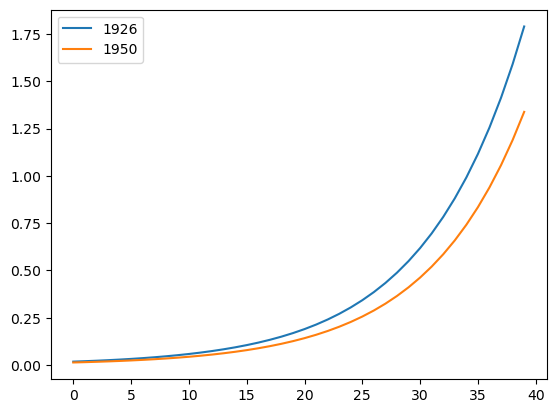

In [141]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(id1['t'],id1['ht'], label='1926')
plt.plot(id2['t'],id2['ht'], label='1950')
plt.legend()
plt.show()

In [162]:
# Get initial lx value (t=0)
initial_lx = df['N'].values[0]

# Initialize lx and dx lists to store calculated values
lx_values = []
dx_values = []

# Iterate through each row in the DataFrame
for index, row in table.iterrows():
    t = row['t']
    if t == 0:
        lx=initial_lx
    else:
        # Calculate lx for current age
        lx = lx_values[-1] - dx_values[-1]
    ht = row['ht']
    dx = lx * ht
    dx_values.append(dx)
    lx_values.append(lx)


# Update 'lx' and 'dx' columns in the DataFrame
table['lx'] = lx_values
table['dx'] = dx_values

In [160]:
table=table.reset_index()
table=table.rename(columns{'index'='identity'})
table.head(42)

,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx
0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155
0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491
0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676
0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387
0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541
0,60,1926,0,No,No,No,No,No,5,0.016391,311524.849749,5106.278543
0,60,1926,0,No,No,No,No,No,6,0.018345,306418.571207,5621.278937
0,60,1926,0,No,No,No,No,No,7,0.020532,300797.292270,6175.927972
0,60,1926,0,No,No,No,No,No,8,0.022979,294621.364298,6770.188845
0,60,1926,0,No,No,No,No,No,9,0.025718,287851.175453,7403.086105


In [176]:
Lx_values = []

# Iterate through each row in the DataFrame
for index, row in table.iterrows():
    t = row['t']
    lx = row['lx']
    dx = row['dx']
    if t == 0:
        Lx =(lx + table.iloc[index+1]['lx'])/2
    else:
        # Calculate Lx for current age
        Lx = Lx_values[-1] - dx
    Lx_values.append(Lx)


# Update 'lx' and 'dx' columns in the DataFrame
table['Lx'] = Lx_values
table.head(42)

,level_0,index,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx,Lx
0,0,0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155,329101.869922
1,1,0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491,325679.964431
2,2,0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676,321890.171755
3,3,0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387,317698.222368
4,4,0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541,313067.979827
5,5,0,60,1926,0,No,No,No,No,No,5,0.016391,311524.849749,5106.278543,307961.701284
6,6,0,60,1926,0,No,No,No,No,No,6,0.018345,306418.571207,5621.278937,302340.422347
7,7,0,60,1926,0,No,No,No,No,No,7,0.020532,300797.292270,6175.927972,296164.494375
8,8,0,60,1926,0,No,No,No,No,No,8,0.022979,294621.364298,6770.188845,289394.305530
9,9,0,60,1926,0,No,No,No,No,No,9,0.025718,287851.175453,7403.086105,281991.219425


In [187]:
#Tx

group=table.groupby('identity')
tx_group = group['Lx'].apply(lambda x: x[::-1].cumsum()[::-1])
table['Tx']=tx_group

table.head(42)

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\325028365.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  tx_group = group['Lx'].apply(lambda x: x[::-1].cumsum()[::-1])


,level_0,identity,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx,Lx,Tx
0,0,0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155,329101.869922,6.305996e+06
1,1,0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491,325679.964431,5.976894e+06
2,2,0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676,321890.171755,5.651214e+06
3,3,0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387,317698.222368,5.329324e+06
4,4,0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541,313067.979827,5.011625e+06
5,5,0,60,1926,0,No,No,No,No,No,5,0.016391,311524.849749,5106.278543,307961.701284,4.698557e+06
6,6,0,60,1926,0,No,No,No,No,No,6,0.018345,306418.571207,5621.278937,302340.422347,4.390596e+06
7,7,0,60,1926,0,No,No,No,No,No,7,0.020532,300797.292270,6175.927972,296164.494375,4.088255e+06
8,8,0,60,1926,0,No,No,No,No,No,8,0.022979,294621.364298,6770.188845,289394.305530,3.792091e+06
9,9,0,60,1926,0,No,No,No,No,No,9,0.025718,287851.175453,7403.086105,281991.219425,3.502696e+06


In [191]:
#ex
table['ex']=table['Tx']/table['Lx']

table.head(5)

,level_0,identity,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx,Lx,Tx,ex
0,0,0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155,329101.869922,6.305996e+06,19.161227
1,1,0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491,325679.964431,5.976894e+06,18.352046
2,2,0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676,321890.171755,5.651214e+06,17.556342
3,3,0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387,317698.222368,5.329324e+06,16.774798
4,4,0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541,313067.979827,5.011625e+06,16.008106


In [200]:
# Check if values in 't' column are equal to 0
mask = table['t'] == 0

# Assign values from 'ex' column to 'ex65' column where 't' equals 0
table.loc[mask, 'ex65'] = table.loc[mask, 'ex']
table.loc[mask, 'tag_out'] = table.loc[mask, 'identity']

# Display the DataFrame
table.head(43)


,level_0,identity,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx,Lx,Tx,ex,ex65,tag_out
0,0,0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155,329101.869922,6.305996e+06,19.161227,19.161227,0.0
1,1,0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491,325679.964431,5.976894e+06,18.352046,NaN,NaN
2,2,0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676,321890.171755,5.651214e+06,17.556342,NaN,NaN
3,3,0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387,317698.222368,5.329324e+06,16.774798,NaN,NaN
4,4,0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541,313067.979827,5.011625e+06,16.008106,NaN,NaN
5,5,0,60,1926,0,No,No,No,No,No,5,0.016391,311524.849749,5106.278543,307961.701284,4.698557e+06,15.256954,NaN,NaN
6,6,0,60,1926,0,No,No,No,No,No,6,0.018345,306418.571207,5621.278937,302340.422347,4.390596e+06,14.522027,NaN,NaN
7,7,0,60,1926,0,No,No,No,No,No,7,0.020532,300797.292270,6175.927972,296164.494375,4.088255e+06,13.804002,NaN,NaN
8,8,0,60,1926,0,No,No,No,No,No,8,0.022979,294621.364298,6770.188845,289394.305530,3.792091e+06,13.103543,NaN,NaN
9,9,0,60,1926,0,No,No,No,No,No,9,0.025718,287851.175453,7403.086105,281991.219425,3.502696e+06,12.421296,NaN,NaN


In [227]:
unique = table[table['ex65'].notna()]
df_final=pd.DataFrame()
df_final['AC']=unique['AC']
df_final['coh']=unique['coh']
df_final['dis']=unique['dis']
df_final['sex']=unique['sex']
df_final['imm']=unique['imm']
df_final['mrt']=unique['mrt']
df_final['p']=unique['p']
df_final['pp']=unique['pp']
df_final['ex65']=unique['ex65']
df_final=df_final.reset_index()
del df_final['index']
df_final

,AC,coh,dis,sex,imm,mrt,p,pp,ex65
0,60,1926,0,No,No,No,No,No,19.161227
1,60,1926,1,No,No,No,No,No,14.667296
2,60,1930,0,No,No,No,No,No,19.769833
3,60,1930,1,No,No,No,No,No,15.196909
4,60,1935,0,No,No,No,No,No,20.397942
...,...,...,...,...,...,...,...,...,...
31315,65,1950,1,1,1,2,5,1,17.263330
31316,65,1950,1,1,1,2,5,2,17.508122
31317,65,1950,1,1,1,2,5,3,17.656484
31318,65,1950,1,1,1,2,5,4,17.839593


In [64]:
def get_hazard(in_df, out_df):
    for model in range(1, 6):
        model_name = f'b{model}'
        gamma = float(in_df.at['gamma', model_name])
        cons = float(in_df.at['_cons', model_name])
        ac_values_with_index = [(index[:2], value) for index, value in in_df.loc[in_df.index.str.endswith('.AC'), model_name].items()]
        coh_values = in_df.loc[in_df.index.str.endswith('.coh'), model_name].values
        dis_values = in_df.loc[in_df.index.str.endswith('.dis_d'), model_name].values
        sex_values = in_df.loc[in_df.index.str.endswith('.SEX'), model_name].values if model_name in ['b2', 'b3', 'b4', 'b5'] else np.array([1])
        imm_values = in_df.loc[in_df.index.str.endswith('.imm_d'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
        mrt_values = in_df.loc[in_df.index.str.endswith('.mrt'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
        pen_values = in_df.loc[in_df.index.str.endswith('.p_lvl'), model_name].values if model_name in ['b4', 'b5'] else np.array([1])
        ppen_values = in_df.loc[in_df.index.str.endswith('.pp_lvl'), model_name].values if model_name == 'b5' else np.array([1])
        
        t = np.arange(40)
        # Generate all possible combinations of values
        combinations = product(ac_values, coh_values, dis_values, sex_values, imm_values, mrt_values, pen_values, ppen_values)
        for ac, coh, dis, sex, imm, mrt, pen, ppen in combinations:
            fct = cons * ac * coh * dis * sex * imm * pen * ppen * np.exp(t * gamma)
            new_row = {'AC': ac, 'coh': coh, 'dis': dis, 'sex': sex, 'imm': imm, 'mrt': mrt, 'p': pen, 'pp': ppen, 't': t, 'hazard': fct}
            out_df = out_df.append(new_row, ignore_index=True)
    return out_df

hazard = pd.DataFrame(columns=['AC', 'coh', 'dis', 'sex', 'imm', 'mrt', 'p', 'pp', 't', 'hazard'])
hazard = get_hazard(df, hazard)

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_

             AC       coh       dis       sex       imm       mrt         p  \
0      1.092892  1.213443  1.000000         1         1         1         1   
1      1.092892  1.213443  1.962717         1         1         1         1   
2      1.092892  1.114559  1.000000         1         1         1         1   
3      1.092892  1.114559  1.962717         1         1         1         1   
4      1.092892  1.022114  1.000000         1         1         1         1   
...         ...       ...       ...       ...       ...       ...       ...   
31315  1.000000  0.877236  1.778348  1.876737  0.712177  1.018762  0.993546   
31316  1.000000  0.877236  1.778348  1.876737  0.712177  1.018762  0.993546   
31317  1.000000  0.877236  1.778348  1.876737  0.712177  1.018762  0.993546   
31318  1.000000  0.877236  1.778348  1.876737  0.712177  1.018762  0.993546   
31319  1.000000  0.877236  1.778348  1.876737  0.712177  1.018762  0.993546   

             pp                                    

C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)
C:\Users\Xavier\AppData\Local\Temp\ipykernel_480\3763914623.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out_df = out_df.append(new_row, ignore_index=True)


In [65]:
hazard

,AC,coh,dis,sex,imm,mrt,p,pp,t,hazard
0,1.092892,1.213443,1.000000,1,1,1,1,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.009334059656542791, 0.010446692684784235, 0..."
1,1.092892,1.213443,1.962717,1,1,1,1,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.0183201175669107, 0.02050390132620166, 0.02..."
2,1.092892,1.114559,1.000000,1,1,1,1,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.008573423058797715, 0.009595387135663094, 0..."
3,1.092892,1.114559,1.962717,1,1,1,1,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.016827203185694275, 0.01883302945274726, 0...."
4,1.092892,1.022114,1.000000,1,1,1,1,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.007862316608021619, 0.008799515796634495, 0..."
...,...,...,...,...,...,...,...,...,...,...
31315,1.000000,0.877236,1.778348,1.876737,0.712177,1.018762,0.993546,1.06118,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.011184891107113435, 0.01258692100382558, 0...."
31316,1.000000,0.877236,1.778348,1.876737,0.712177,1.018762,0.993546,1.022584,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.010778087306466844, 0.012129124208688419, 0..."
31317,1.000000,0.877236,1.778348,1.876737,0.712177,1.018762,0.993546,1.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.01054005079921732, 0.011861249744459545, 0...."
31318,1.000000,0.877236,1.778348,1.876737,0.712177,1.018762,0.993546,0.972932,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.010254756920204425, 0.011540194180876413, 0..."


,level_0,identity,AC,coh,dis,sex,imm,mrt,p,pp,t,ht,lx,dx,Lx,Tx
0,0,0,60,1926,0,No,No,No,No,No,0,0.009334,330645.000000,3086.260155,329101.869922,329101.869922
1,1,0,60,1926,0,No,No,No,No,No,1,0.010447,327558.739845,3421.905491,325679.964431,325679.964431
2,2,0,60,1926,0,No,No,No,No,No,2,0.011692,324136.834353,3789.792676,321890.171755,321890.171755
3,3,0,60,1926,0,No,No,No,No,No,3,0.013086,320347.041677,4191.949387,317698.222368,317698.222368
4,4,0,60,1926,0,No,No,No,No,No,4,0.014645,316155.092290,4630.242541,313067.979827,313067.979827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252795,1252795,31319,65,1950,1,1,1,2,5,5,35,0.500472,3548.523765,1775.935304,3098.883873,3098.883873
1252796,1252796,31319,65,1950,1,1,1,2,5,5,36,0.563206,1772.588461,998.332218,2100.551656,2100.551656
1252797,1252797,31319,65,1950,1,1,1,2,5,5,37,0.633804,774.256243,490.726636,1609.825020,1609.825020
1252798,1252798,31319,65,1950,1,1,1,2,5,5,38,0.713251,283.529608,202.227903,1407.597117,1407.597117


KeyboardInterrupt: 

In [ ]:
def get_hazard(in_df, out_df, age_to):
    for model in range(1, 6):
        model_name = f'b{model}'
        gamma = float(in_df.at['gamma', model_name])
        cons = float(in_df.at['_cons', model_name])
        ac_values = in_df.loc[in_df.index.str.endswith('.AC'), model_name].values
        coh_values = in_df.loc[in_df.index.str.endswith('.coh'), model_name].values
        dis_values = in_df.loc[in_df.index.str.endswith('.dis_d'), model_name].values
        sex_values = in_df.loc[in_df.index.str.endswith('.SEX'), model_name].values if model_name in ['b2', 'b3', 'b4', 'b5'] else np.array([1])
        imm_values = in_df.loc[in_df.index.str.endswith('.imm_d'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
        mrt_values = in_df.loc[in_df.index.str.endswith('.mrt'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
        pen_values = in_df.loc[in_df.index.str.endswith('.p_lvl'), model_name].values if model_name in ['b4', 'b5'] else np.array([1])
        ppen_values = in_df.loc[in_df.index.str.endswith('.pp_lvl'), model_name].values if model_name == 'b5' else np.array([1])
        
        t = np.arange(65 - age_to)
        for ac, AC in zip(ac_values, in_df.loc[in_df.index.str.endswith('.AC'), :].iloc[:, :1].itertuples(index=False)):
            for coh, COH in zip(coh_values, in_df.loc[in_df.index.str.endswith('.coh'), :].iloc[:, :1].itertuples(index=False)):
                for dis, DIS in zip(dis_values, in_df.loc[in_df.index.str.endswith('.dis_d'), :].iloc[:, :1].itertuples(index=False)):
                    for sex, SEX in zip(sex_values, in_df.loc[in_df.index.str.endswith('.SEX'), :].iloc[:, :1].itertuples(index=False)) if model_name in ['b2', 'b3', 'b4', 'b5'] else [(1, 1)]:
                        for imm, IMM in zip(imm_values, in_df.loc[in_df.index.str.endswith('.imm_d'), :].iloc[:, :1].itertuples(index=False)) if model_name in ['b3', 'b4', 'b5'] else [(1, 1)]:
                            for mrt, MRT in zip(mrt_values, in_df.loc[in_df.index.str.endswith('.mrt'), :].iloc[:, :1].itertuples(index=False)) if model_name in ['b3', 'b4', 'b5'] else [(1, 1)]:
                                for pen, P in zip(pen_values, in_df.loc[in_df.index.str.endswith('.p_lvl'), :].iloc[:, :1].itertuples(index=False)) if model_name in ['b4', 'b5'] else [(1, 1)]:
                                    for ppen, PP in zip(ppen_values, in_df.loc[in_df.index.str.endswith('.pp_lvl'), :].iloc[:, :1].itertuples(index=False)) if model_name == 'b5' else [(1, 1)]:
                                        fct = cons * ac * coh * dis * sex * imm * pen * ppen * np.exp(t * gamma)
                                        new_rows={'hazard' : fct}
                                        #new_rows = {'AC': AC, 'coh': COH, 'dis': DIS, 'sex': SEX, 'imm': IMM, 'mrt': MRT, 'p': P, 'pp': PP, 't': t, 'hazard': fct}
                                        out_df = out_df.append(new_rows, ignore_index=True)
    return out_df

hazard = pd.DataFrame(columns=['AC', 'coh', 'dis', 'sex', 'imm', 'mrt', 'p', 'pp', 't', 'hazard'])
hazard = get_hazard(df, hazard, 66)
print(hazard)


In [67]:
for model in range(1, 6):
    model_name = f'b{model}'
    gamma = float(df.at['gamma', model_name])
    cons = float(df.at['_cons', model_name])
    ac_values_with_index = [(index[:2], value) for index, value in df.loc[df.index.str.endswith('.AC'), model_name].items()]
    coh_values = df.loc[df.index.str.endswith('.coh'), model_name].values
    dis_values = df.loc[df.index.str.endswith('.dis_d'), model_name].values
    sex_values = df.loc[df.index.str.endswith('.SEX'), model_name].values if model_name in ['b2', 'b3', 'b4', 'b5'] else np.array([1])
    imm_values = df.loc[df.index.str.endswith('.imm_d'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
    mrt_values = df.loc[df.index.str.endswith('.mrt'), model_name].values if model_name in ['b3', 'b4', 'b5'] else np.array([1])
    pen_values = df.loc[df.index.str.endswith('.p_lvl'), model_name].values if model_name in ['b4', 'b5'] else np.array([1])
    ppen_values =df.loc[df.index.str.endswith('.pp_lvl'), model_name].values if model_name == 'b5' else np.array([1])
    
    for ac, AC in zip(ac_values, df.loc[df.index.str.endswith('.AC'), :].iloc[:,:1].itertuples(index=False)):
        if model_name=='b2':
            print(ac_values_with_index)

[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]
[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]
[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]
[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]
[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]
[('60', 1.143737), ('61', 1.055005), ('62', 1.077806), ('63', 1.050681), ('64', 1.090197), ('65', 1.0)]


In [304]:
# The get_hazard function uses the above table and loops over all possible caracteristics 
# to compute the hazard function of the 5 models presented. We need to specify the input dataframe,
# output dataframe and the age we want to have a hazard estimate to. 


In [ ]:
def compute_haz(in_df)
-> the current function only considers models that satisfy all the id conditions. To work around that, create a separate
program that does the computing at the end, and nest it in the loop of the get_hazard function with else statements. 

Or work toward a model where we specify the characteristics we want and compute strictly for them

In [ ]:
def get_hazard(in_df,out_df,age_to):
    #identify the model the loop is currently estimating
    for model in range(1,6):
        model_name=f'b{model}'
        #get the gamme and constant for that model
        gamma=float(in_df.iloc[in_df.index.get_loc('gamma'),in_df.columns.get_loc(model_name)])
        cons=float(in_df.iloc[in_df.index.get_loc('_cons'),in_df.columns.get_loc(model_name)])
        #create empty list
        rows=[]
        #loop over different claiming age
        for indexAC,rowAC in in_df.iterrows():
            if indexAC.endswith('.AC'):
                #store the hazard ratio of the specific claiming age
                ac=float(rowAC[model_name])
                #save the specific characteristic used in computing that hazard function
                AC=indexAC[:2]
                #loop over different birth cohorts
                for indexCOH,rowCOH in in_df.iterrows():
                    if indexCOH.endswith('.coh'):
                        coh=float(rowCOH[model_name])
                        COH=indexCOH[:4]
                        #loop over disability status
                        for indexDIS,rowDIS in in_df.iterrows():
                            if indexDIS.endswith('.dis_d'):
                                dis=float(rowDIS[model_name])
                                DIS=indexDIS[:1]
                                #loop over sex, only when computing models 2, 3 ,4 and 5
                                for indexSEX,rowSEX in in_df.iterrows():
                                    if indexSEX.endswith('.SEX') and model_name in ['b2','b3','b4','b5']:
                                        sex=float(rowSEX[model_name])
                                        SEX=indexSEX[:1]
                                    else:
                                        sex=1
                                        SEX=None
                                    #loop over immigrant dummy for models 3, 4 and 5
                                    for indexIMM,rowIMM in in_df.iterrows():
                                        if indexIMM.endswith('.imm_d') and model_name in ['b3','b4','b5']:
                                            imm=float(rowIMM[model_name])
                                            IMM=indexIMM[:1]
                                        else: 
                                            imm=1
                                            IMM=None
                                        #loop over marital status for models 3, 4 and 5
                                        for indexMRT,rowMRT in in_df.iterrows():
                                            if indexMRT.endswith('.mrt') and model_name in ['b3','b4','b5']:
                                                mrt=float(rowMRT[model_name])
                                                MRT=indexMRT[:1]
                                            else: 
                                                mrt=1
                                                MRT=None
                                            #loop over public pension quintiles for models 4 and 5
                                            for indexPLVL,rowPLVL in in_df.iterrows():
                                                if indexPLVL.endswith('.p_lvl') and model_name in ['b4','b5']:
                                                    pen=float(rowPLVL[model_name])
                                                    P=indexPLVL[:1]
                                                else:
                                                    pen=1
                                                    P=None
                                                #loop over private pension quintiles for model 5
                                                for indexPPLVL,rowPPLVL in in_df.iterrows():
                                                    if indexPPLVL.endswith('.pp_lvl') and model_name in ['b5']:
                                                        ppen=float(rowPPLVL[model_name])
                                                        PP=indexPPLVL[:1]
                                                    else:
                                                        ppen=1
                                                        PP=None
                                                    #create a range of _t time periods to apply the hazard function to
                                                    end=age_to-65
                                                    t=list(range(end))
                                                    #loop over that range
                                                    for time in t: 
                                                        #compute hazard function
                                                        fct = cons*ac*coh*dis*sex*imm*pen*ppen*np.exp(time*gamma)                    
                                                        #store the values in a dictionnary
                                                        new_row={'AC':AC,'coh':COH,'dis':DIS,'sex':SEX,'imm':IMM,'mrt':MRT,'p':P,'pp':PP,'t':time,'hazard':fct}
                                                        #append the list with the current dictionary
                                                        rows.append(new_row)
    #append the output dataset with the complete list of hazard rates
    out_df=out_df.append(rows, ignore_index=True)     
    return out_df

#create the output dataset
hazard=pd.DataFrame(columns=['AC','coh','dis','sex','imm','mrt','p','pp','t','hazard'])

#
hazard=get_hazard(df, hazard,66)
print(hazard.head(5))

Unexpected exception formatting exception. Falling back to standard exception


In [229]:
hazard=get_hazard(df, hazard)
print(hazard.head(40))

                                                   id   t    hazard
0   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   0  0.009334
1   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   1  0.010447
2   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   2  0.011692
3   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   3  0.013086
4   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   4  0.014645
5   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   5  0.016391
6   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   6  0.018345
7   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   7  0.020532
8   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   8  0.022979
9   {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...   9  0.025718
10  {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...  10  0.028784
11  {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...  11  0.032215
12  {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'dis'...  12  0.036055
13  {'AC': '_t:60.AC', 'coh': '_t:1926.coh', 'di

C:\Users\Xavier\AppData\Local\Temp\ipykernel_11228\4070789248.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out=out.append(rows, ignore_index=True)


In [288]:
for indexAC,rowAC in df.iterrows():
    if indexAC.endswith('.AC'):
        AC=indexAC[1:3]
        print(AC)

0.
1.
2.
3.
4.
5b


In [299]:
"d"=="bcd"
print(d)

NameError: name 'd' is not defined

In [309]:
end=70-65
t=list(range(end))
print(t)

[0, 1, 2, 3, 4]


In [1]:
print(6*6*2*2*2*3*5*6)

25920


In [3]:
import pandas as pd
df = pd.read_csv('../data/ex_no_dis.csv', sep=',')

FileNotFoundError: [Errno 2] No such file or directory: '../data/ex_no_dis.csv'